In [1]:
# import basic frameworks & list directories
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os, sys

data_dir = '/content/drive/MyDrive/Dataset'
!ls {data_dir}

Bus  Car  motorcycle  Truck


In [42]:
pip install streamlit

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.4/8.4 MB 15.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 19.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 46.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 11.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.3 MB/s eta 0:00:00


In [47]:
!pip install --upgrade streamlit


#### Loading data

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
def load_metadata(dir_path):
    """
    Reads the metadata of images in the given directory
    and stores in a dataframe

    """

    # to store path & class
    rows = []
    # iter over all directories in given directory
    for dir_path, dir_name, file_list in os.walk(dir_path):
        # iter thorugh files
        for file in file_list:
            # get the image file path
            file_path = os.path.join(dir_path, file)
            # get the label from dir name
            label = os.path.split(dir_path)[-1]
            # append to the list
            rows.append([file_path, label])

    # return the dataframe
    return pd.DataFrame(rows, columns=['image_path', 'class'])

In [4]:
img_df = load_metadata(data_dir)
print("number of images present in the dataset:", img_df.shape[0])
print("number of classes:", len(img_df['class'].unique()))

number of images present in the dataset: 400
number of classes: 4


<Axes: title={'center': 'distribution of classes in the dataset'}>

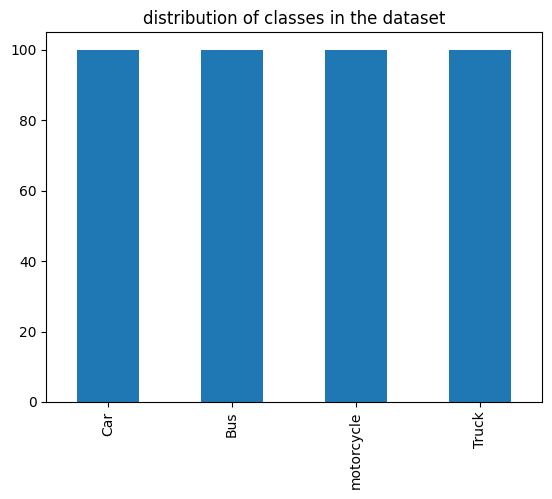

In [5]:
img_df['class'].value_counts().plot(kind="bar",
        title="distribution of classes in the dataset")

- All four classes are equally distributed.

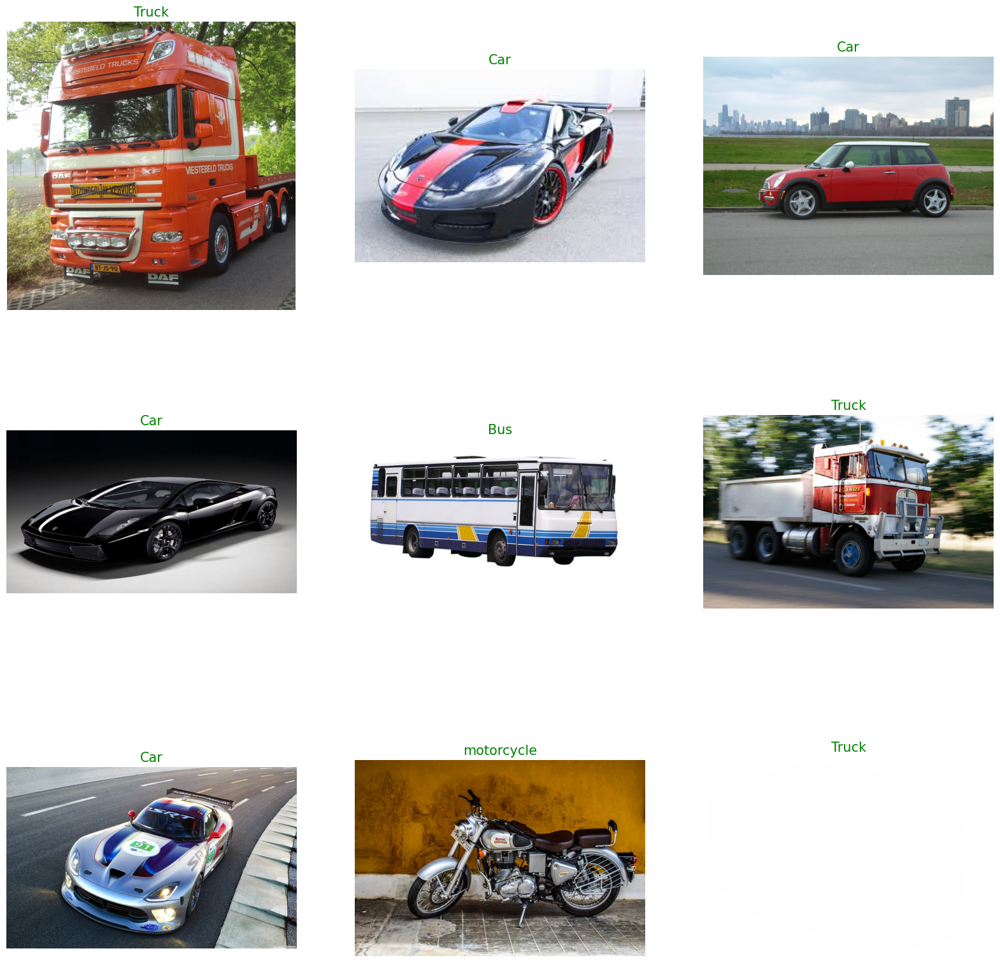

In [6]:
sample_img_paths, sample_labels = zip(*img_df.sample(9, random_state=321).values.tolist())

# create a matplotlib figure
plt.figure(figsize= (20, 20))
# iter thorugh 9 images and display them
for i in range(9):
    # create a subplot grid
    plt.subplot(3, 3, i + 1)
    # preprocess/resize the images
    image = plt.imread(sample_img_paths[i])
    image = image/255
    plt.imshow(image)
    # get name of class/label
    class_name = sample_labels[i]
    # show the class label as image title
    plt.title(class_name, fontsize= 15, color= 'green')
    # turn off the axis
    plt.axis('off')

# h
plt.show()

### Data Augumentation

In [7]:
# imports
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.preprocessing import image

In [8]:
def visualize_images(org_img, aug_img):
    """
    Displays the original and Augumented image side by side
    """
    # create a matplotlib figure
    fig = plt.figure()
    # split the axis through subplot & show original image
    plt.subplot(1,2,1)
    plt.imshow(org_img)
    plt.title('Original image')
    # split the axis through 2nd subplot & show augumented image
    plt.subplot(1,2,2)
    plt.imshow(aug_img)
    plt.title('Augmented image')

#### Data Augumentation using tf image

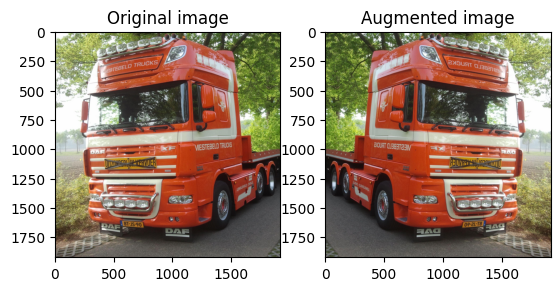

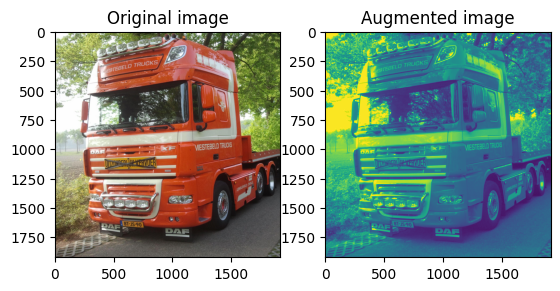

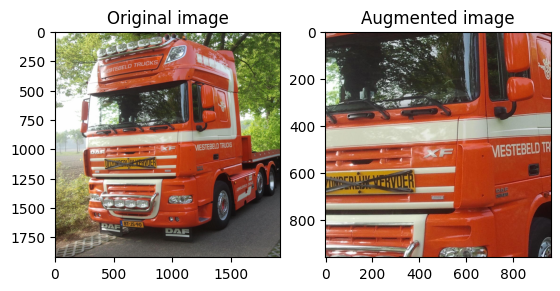

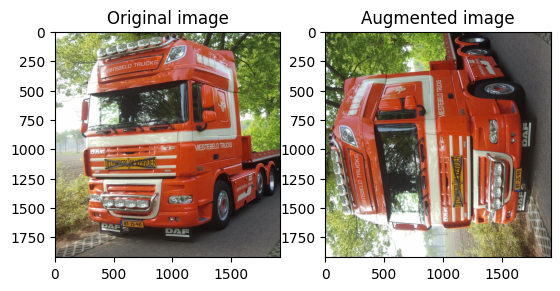

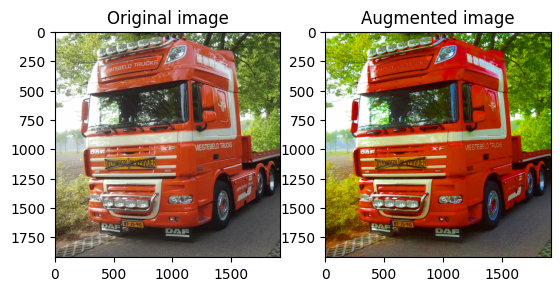

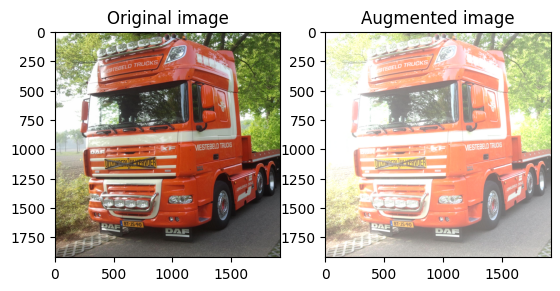

In [9]:
image = plt.imread(sample_img_paths[0])

flipped = tf.image.flip_left_right(image)
visualize_images(image, flipped)

grayscaled = tf.image.rgb_to_grayscale(image)
visualize_images(image, tf.squeeze(grayscaled))

cropped = tf.image.central_crop(image, central_fraction=0.5)
visualize_images(image, cropped)

rotated = tf.image.rot90(image)
visualize_images(image, rotated)

saturated = tf.image.adjust_saturation(image, 3)
visualize_images(image, saturated)

bright = tf.image.adjust_brightness(image, 0.4)
visualize_images(image, bright)

#### Data augmentation using tf layers

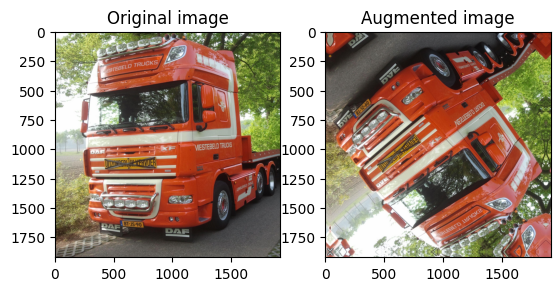

In [10]:
IMG_SIZE = 224

# create a keras squential model with all augumentation layers
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomRotation(0.2),
    layers.RandomZoom(0.2),
    layers.Rescaling(1./255),

])

image = plt.imread(sample_img_paths[0])
augmented_image = data_augmentation(image)
visualize_images(image, augmented_image)

#### Loading & Splitting Data

In [11]:
from PIL import Image

# get the unique labels & map/encode them
unique_label = sorted(img_df['class'].unique())
label_map = dict(zip(unique_label, range(0,len(unique_label))))

def load_data(data_df, label_map):
    """
    Loads the actual images & labels data
    from the metadata dataframe.
    """

    # lists to store images & their corresponding labels
    images_arr = []
    label_arr = []
    # iter through all data in the dataframe
    for img_path, label in data_df.values:
        # read & store images along with their labels
        try:
            img_arr = plt.imread(img_path)
            # print(img_arr.shape)
            img = Image.fromarray(img_arr, 'RGB')
            img = img.resize(size=(224, 224))
            # print(np.array(img).shape)
            images_arr.append(np.array(img))
            label_arr.append(label_map[label])
        except:
            continue

    # convert into numpy array's and return
    return np.array(images_arr), np.array(label_arr)

In [12]:
from sklearn.model_selection import train_test_split

# split the data into training & testing
train_val_data, test_data = train_test_split(img_df, train_size=0.8, random_state=45)
# use the metadata df to load train & testing images
X_train, y_train = load_data(train_val_data, label_map)
X_test, y_test = load_data(test_data, label_map)
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((320, 224, 224, 3), (320,), (80, 224, 224, 3), (80,))

#### Simple CNN Model

In [13]:
def get_model(num_classes, data_aug=False):

    """
    This function create a simple baseline
    CNN model using tensorflow-keras.
    """


    aug_layers = []
    if data_aug:
        # define different augumentation layers
        aug_layers = [layers.Rescaling(1./255),
                      layers.RandomFlip("horizontal_and_vertical"),
                      layers.RandomRotation(0.2),
                      layers.RandomZoom(0.2),
                     ]

    # create model layers - CNN, pooling, dense & output
    model_layers = [
      layers.Conv2D(64, 3, padding='same', activation='relu'),
      layers.MaxPooling2D(),
      layers.Flatten(),
      layers.Dense(16, activation='relu'),
      layers.Dense(num_classes)
    ]

    # combine all layers & create a sequential model
    all_layers = [*aug_layers, *model_layers]
    model = tf.keras.Sequential(all_layers)

    # return keras model
    return model

In [14]:
# define the global epochs for all models
num_epochs = 20
# get the output layers using the label_map dict created
num_classes = len(label_map)
num_classes

4

### Model 1 with only rescaling (No Image augmentation)

In [15]:
model_1 = get_model(num_classes)
# compile & build the model
model_1.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
model_1.build(input_shape=(None,224,224,3))
print(model_1.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 64)      0         
 D)                                                              
                                                                 
 flatten (Flatten)           (None, 802816)            0         
                                                                 
 dense (Dense)               (None, 16)                12845072  
                                                                 
 dense_1 (Dense)             (None, 4)                 68        
                                                                 
Total params: 12846932 (49.01 MB)
Trainable params: 12846932 (49.01 MB)
Non-trainable params: 0 (0.00 Byte)
____________

In [16]:
# fit the model on train data & evaluate on test data.
res1 = model_1.fit(X_train, y_train,
                validation_data=(X_test, y_test),
                epochs=num_epochs)
# save the model
model_1.save('model_1.h5')

Epoch 1/20
10/10 [==============================] - 9s 83ms/step - loss: 4359.6826 - accuracy: 0.2656 - val_loss: 1.3862 - val_accuracy: 0.2375
Epoch 2/20
10/10 [==============================] - 0s 47ms/step - loss: 1.3851 - accuracy: 0.2219 - val_loss: 1.3861 - val_accuracy: 0.2375
Epoch 3/20
10/10 [==============================] - 0s 47ms/step - loss: 1.3837 - accuracy: 0.2562 - val_loss: 1.3862 - val_accuracy: 0.2375
Epoch 4/20
10/10 [==============================] - 0s 47ms/step - loss: 1.3826 - accuracy: 0.2562 - val_loss: 1.3862 - val_accuracy: 0.2375
Epoch 5/20
10/10 [==============================] - 0s 46ms/step - loss: 1.3822 - accuracy: 0.2562 - val_loss: 1.3862 - val_accuracy: 0.2375
Epoch 6/20
10/10 [==============================] - 0s 44ms/step - loss: 1.3821 - accuracy: 0.2562 - val_loss: 1.3863 - val_accuracy: 0.2375
Epoch 7/20
10/10 [==============================] - 0s 47ms/step - loss: 1.3821 - accuracy: 0.2562 - val_loss: 1.3863 - val_accuracy: 0.2375
Epoch 8/20

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


### Model 2 with Image augmentation

In [17]:
model_2 = get_model(num_classes, data_aug=True)
# compile & build the model
model_2.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
model_2.build(input_shape=(None,224,224,3))
print(model_2.summary())
# save the mpodel
model_2.save('model_2.h5')

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 random_flip_1 (RandomFlip)  (None, 224, 224, 3)       0         
                                                                 
 random_rotation_1 (RandomR  (None, 224, 224, 3)       0         
 otation)                                                        
                                                                 
 random_zoom_1 (RandomZoom)  (None, 224, 224, 3)       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 64)      1792      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 112, 112, 64)      0         
 g2D)                                                 

In [18]:
# fit the model on train data & evaluate on test data.
res2 = model_2.fit(X_train, y_train,
                validation_data=(X_test, y_test),
                epochs=num_epochs)

Epoch 1/20
10/10 [==============================] - 2s 77ms/step - loss: 5.5078 - accuracy: 0.2031 - val_loss: 1.3863 - val_accuracy: 0.0000e+00
Epoch 2/20
10/10 [==============================] - 0s 47ms/step - loss: 1.3863 - accuracy: 0.0031 - val_loss: 1.3864 - val_accuracy: 0.0000e+00
Epoch 3/20
10/10 [==============================] - 0s 46ms/step - loss: 1.3862 - accuracy: 0.0031 - val_loss: 1.3864 - val_accuracy: 0.0000e+00
Epoch 4/20
10/10 [==============================] - 0s 49ms/step - loss: 1.3862 - accuracy: 0.0031 - val_loss: 1.3864 - val_accuracy: 0.0000e+00
Epoch 5/20
10/10 [==============================] - 0s 49ms/step - loss: 1.3862 - accuracy: 0.0031 - val_loss: 1.3865 - val_accuracy: 0.0000e+00
Epoch 6/20
10/10 [==============================] - 0s 47ms/step - loss: 1.3862 - accuracy: 0.0031 - val_loss: 1.3866 - val_accuracy: 0.0000e+00
Epoch 7/20
10/10 [==============================] - 0s 47ms/step - loss: 1.3863 - accuracy: 0.0000e+00 - val_loss: 1.3866 - val_ac

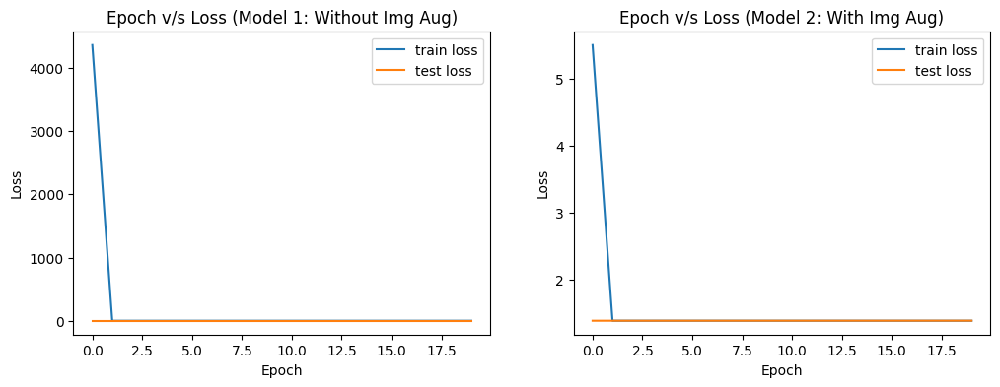

In [19]:
# plots to compare accuracy between model_1 and model_2
fig = plt.figure(figsize=(12,4))
axes = fig.subplots(nrows=1, ncols=2)

# plot the losses of simple cnn model without image augumentation
axes[0].plot(res1.history['loss'])
axes[0].plot(res1.history['val_loss'])
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title('Epoch v/s Loss (Model 1: Without Img Aug)')
axes[0].legend(['train loss', 'test loss'])

# plot the losses of simple cnn model with image augumentation
axes[1].plot(res2.history['loss'])
axes[1].plot(res2.history['val_loss'])
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].set_title('Epoch v/s Loss (Model 2: With Img Aug)')
axes[1].legend(['train loss', 'test loss'])

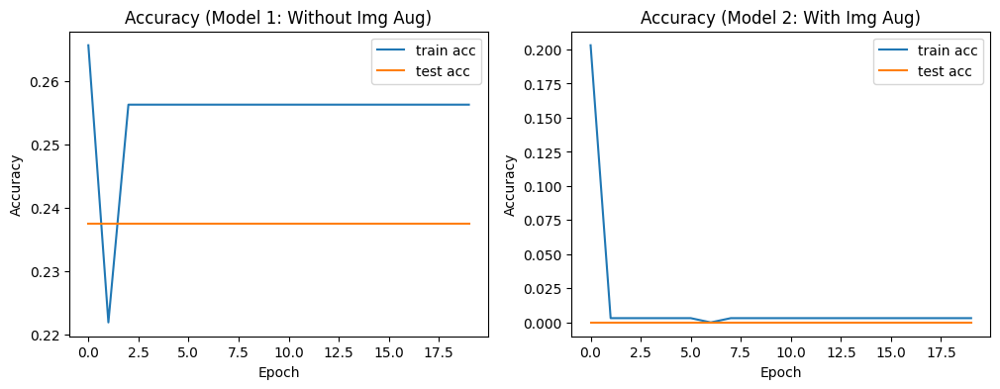

In [20]:
# plots to compare accuracy between model_1 and model_2
fig = plt.figure(figsize=(12,4))
axes = fig.subplots(nrows=1, ncols=2)

# plot the accuracy of simple cnn model without image augumentation
axes[0].plot(res1.history['accuracy'])
axes[0].plot(res1.history['val_accuracy'])
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].set_title('Accuracy (Model 1: Without Img Aug)')
axes[0].legend(['train acc', 'test acc'])

# plot the accuracy of simple cnn model with image augumentation
axes[1].plot(res2.history['accuracy'])
axes[1].plot(res2.history['val_accuracy'])
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Accuracy')
axes[1].set_title('Accuracy (Model 2: With Img Aug)')
axes[1].legend(['train acc', 'test acc'])

- The images in the datasets looks too graphic and very different to real world. Hence the model will not perform well when asked to predict on real world data. Also, there are only 4 vechile types in this dataset. We can overcome these problems by extending the dataset.

### Next Step: Extending Data & Classes
- Add more images into 4 existing classes of datasets to improve the quality of the dataset and the machine learning model.
- Extend classes available by finding more data, to add other vehicle types like airplane & train.
- Add some random non-vehicle images to a class named "non-vehicle" so that models knows when a vehicle is not present in the given input.
- Compare the performance of different pretrained models.

#### Additional datasets under consideration:
- https://www.kaggle.com/datasets/dataclusterlabs/indian-vehicle-dataset
- https://www.kaggle.com/datasets/maciejgronczynski/vehicle-classification-dataset
- https://www.kaggle.com/datasets/zwartfreak/bike-images/
- https://www.kaggle.com/datasets/deeptrial/miniimagenet/

#### References:

- Data Augumentation using Tensorflow, https://www.tensorflow.org/tutorials/images/data_augmentation
- Image plotting with matplotlib, https://matplotlib.org/stable/tutorials/images.html

### Extending Dataset

- As discussed above, extending the data to include more classes & improve the quality of the model.
- Adding some non-vehicle images from image-net dataset (mini version) after removing any vechile related classes from them.
- This create a new dataset with around 3000 images & 7 classes.
- 7 classes are 'Car', 'trains', 'planes', 'Truck', 'Bus', 'motorcycle', & non-vehicles.

In [21]:
# define the all data directories
all_data_dirs = [
    "/content/drive/MyDrive/Dataset",
    "/content/drive/MyDrive/archive/Vehicle_5_classes_sample",
    "/content/drive/MyDrive/dataset-2",
    "/content/drive/MyDrive/archive-2"
]

# create a empty dataframe to store metadata
all_img_df = pd.DataFrame()

# iter through all dir to collect metadata
for data_dir in all_data_dirs:
    img_df = load_metadata(data_dir)
    all_img_df = pd.concat([all_img_df, img_df])

# get the image extension
all_img_df['ext'] = all_img_df['image_path'].str.split(".").apply(lambda x:x[-1])
# remove any unwanted extensions
valid_exts = ['png', 'jpg', 'jpeg', 'JPG']
all_img_df = all_img_df[all_img_df['ext'].isin(valid_exts)]

# rename some class names to standardize
class_names_map = {'cars': 'Car', 'bike-images': 'motorcycle'}
all_img_df['class'] = all_img_df['class'].replace(class_names_map)

# define final class names
final_classes = ['Car', 'trains', 'planes', 'Truck', 'Bus', 'motorcycle']
merged_data_df = all_img_df[all_img_df['class'].isin(final_classes)].reset_index(drop=1)

In [22]:
mini_img_net_dir = "/content/drive/MyDrive/ImageNet-Mini/images"
mini_img_net_classes = "/content/drive/MyDrive/ImageNet-Mini/imagenet_class_index.json"

def map_class_names(i):
    """
    maps the imagenet folder ids to
    class names
    """
    mapp = dict(cdf.values.tolist())
    try:
        return mapp[i]
    except:
        return pd.NA

# load data from mini image net to use them as non-vechile images.
imgnet_df = load_metadata(mini_img_net_dir)
cls_df = pd.read_json(mini_img_net_classes).transpose()
# remove any vehicle related classes from the imagenet data.
cdf = cls_df[~cls_df[1].str.contains(r'car|bus|truck|plane|motorcycle|train|ship')]
imgnet_df['class_name'] = imgnet_df['class'].apply(map_class_names)
imgnet_df = imgnet_df.dropna(subset=['class_name'])
imgnet_df['class'] = imgnet_df['class_name']
# rename all the classes as non-vehicle
imgnet_df['class'] = 'non-vehicle'

# sample the data to reduce the size with existing data.
non_veh_sample = imgnet_df.sample(1000, random_state=2023)[['image_path', 'class']]
non_veh_sample.head()

<ipython-input-22-9b8be7b74479>:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  imgnet_df['class'] = imgnet_df['class_name']
<ipython-input-22-9b8be7b74479>:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  imgnet_df['class'] = 'non-vehicle'


,image_path,class
3169,/content/drive/MyDrive/ImageNet-Mini/images/n0...,non-vehicle
474,/content/drive/MyDrive/ImageNet-Mini/images/n0...,non-vehicle
1401,/content/drive/MyDrive/ImageNet-Mini/images/n0...,non-vehicle
2303,/content/drive/MyDrive/ImageNet-Mini/images/n0...,non-vehicle
3013,/content/drive/MyDrive/ImageNet-Mini/images/n0...,non-vehicle


In [23]:
# merge all metadata & create label maps with unqiue classes.
images_df = pd.concat([merged_data_df.drop('ext', axis=1), non_veh_sample])
unique_label = sorted(images_df['class'].unique())
label_map = dict(zip(unique_label, range(0,len(unique_label))))

print("number of images present in the dataset:", images_df.shape[0])
print("number of classes:", len(images_df['class'].unique()))
print("classes:", unique_label)

number of images present in the dataset: 2976
number of classes: 7
classes: ['Bus', 'Car', 'Truck', 'motorcycle', 'non-vehicle', 'planes', 'trains']


<Axes: title={'center': 'distribution of classes in the dataset'}>

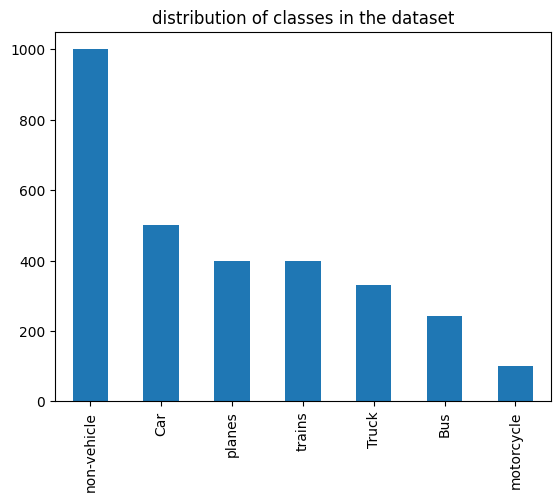

In [24]:
images_df['class'].value_counts().plot(kind="bar",
        title="distribution of classes in the dataset")

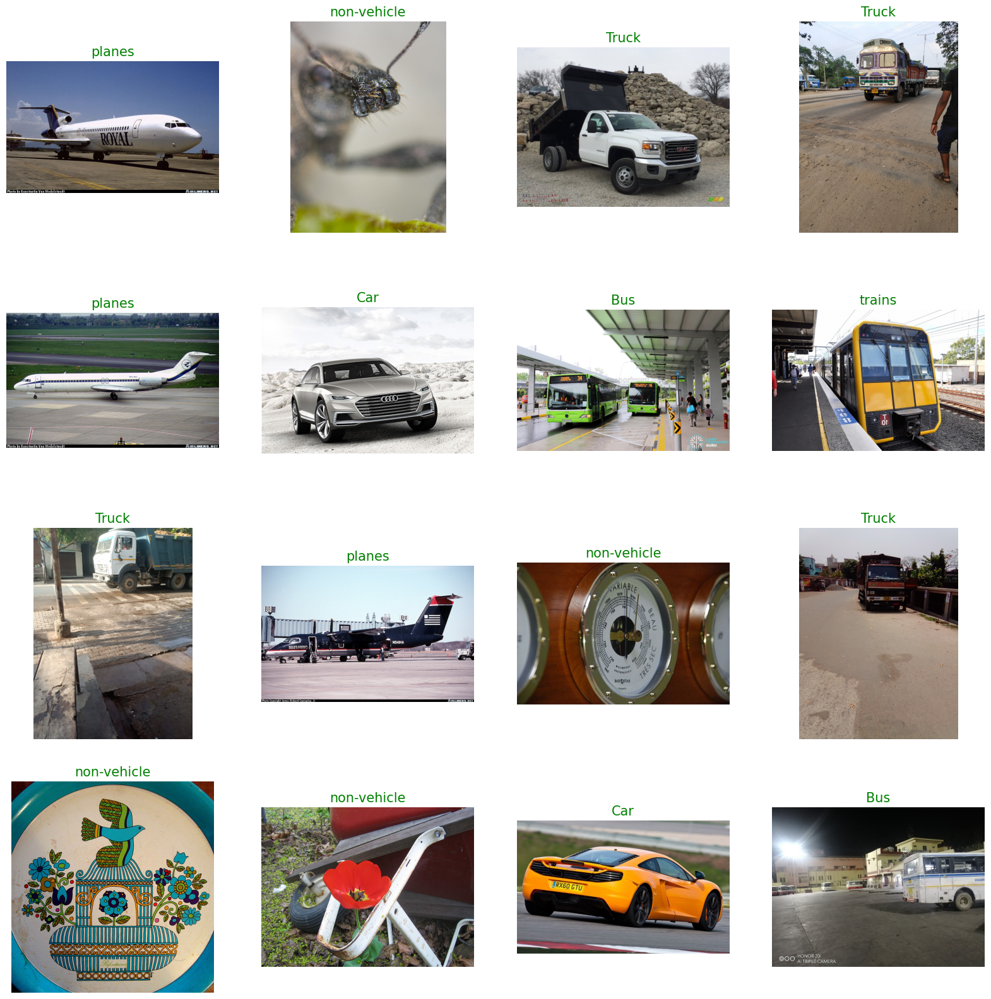

In [25]:
# sample the images from full dataset
sample_img_paths, sample_labels = zip(*images_df.sample(16, random_state=45).values.tolist())

# plot some sample images from extended data with 7 classes
plt.figure(figsize= (20, 20))
for i in range(len(sample_img_paths)):
    # create a subplot grid
    plt.subplot(4, 4, i + 1)
    image = plt.imread(sample_img_paths[i])
    image = image/255
    plt.imshow(image)
    # get name of class/label
    class_name = sample_labels[i]
    plt.title(class_name, fontsize= 15, color= 'green')
    plt.axis('off')

plt.show()

#### Splitting the extended dataset with 7 classes

<Axes: title={'center': 'Class distribution in the training dataset'}>

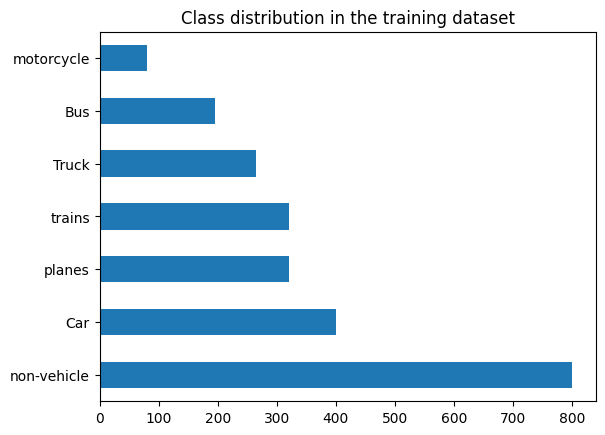

In [26]:
from sklearn.model_selection import train_test_split

# split the full data into train & test data
train_val_data, test_data = train_test_split(images_df, stratify=images_df['class'],
                                             train_size=0.8, random_state=45)

# visualize the distribution of classes in training data
train_val_data['class'].value_counts().plot(kind="barh",
                    title="Class distribution in the training dataset")
# test_data['class'].value_counts(kind="barh")

In [27]:
# load the extended dataset from image metadata dataframe.
X_train, y_train = load_data(train_val_data, label_map)
X_test, y_test = load_data(test_data, label_map)
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((2362, 224, 224, 3), (2362,), (593, 224, 224, 3), (593,))

#### Define pretrained image classification models

In [28]:
# imports different pretrained models
from tensorflow.keras.applications import ResNet50, DenseNet121
from tensorflow.keras.applications import VGG16, VGG19
from tensorflow.keras.applications import MobileNet, MobileNetV2
from tensorflow.keras.applications import EfficientNetB0, EfficientNetB1
from tensorflow.keras.applications import NASNetMobile

## intialize all models in a dictonary

all_models = { # 'simple_cnn': model_2,
'vgg16': VGG16(weights='imagenet',input_shape=(224, 224, 3), include_top=False),
'vgg19': VGG19(weights='imagenet',input_shape=(224, 224, 3), include_top=False),
'resnet50': ResNet50(weights='imagenet',input_shape=(224, 224, 3), include_top=False),
'densenet': DenseNet121(weights='imagenet',input_shape=(224, 224, 3), include_top=False),
'mobilenet': MobileNet(weights='imagenet',input_shape=(224, 224, 3), include_top=False),
'mobilenet_v2': MobileNetV2(weights='imagenet',input_shape=(224, 224, 3), include_top=False),
'nasnet_mobile': NASNetMobile(weights='imagenet',input_shape=(224, 224, 3), include_top=False)
             }

In [29]:
from tensorflow import keras

def extend_pretrained_model(base_model, num_classes=7):

    """
    Extends the pretrained model & add data augumentation
    and classification layers for vehicle classification.
    """

    data_aug = tf.keras.Sequential([
        layers.RandomFlip("horizontal_and_vertical"),
                      layers.RandomRotation(0.2),
                      layers.RandomZoom(0.2),
                      layers.Rescaling(1./255),
                     ])

    # unfreeze the base_model
    base_model.trainable = True
    # Create new model on top
    inputs = keras.Input(shape=(224, 224, 3))
    x = data_aug(inputs)
    x = base_model(x, training=True)
    x = layers.GlobalAveragePooling2D()(x)
    # Regularize with dropout
    x = layers.Dropout(0.2)(x)
    outputs = layers.Dense(num_classes)(x)

    model = keras.Model(inputs, outputs)

    return model

#### Train pretrained models

In [30]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# dicts to store results
models_hist = {}
results_df = {}

# iter thorugh all pretrained models
for m_name in all_models:
    print()
    print("*"*50)
    print(f"Training {m_name}")

    # get the model name & define callbacks
    mod = all_models[m_name]
    early_stop = EarlyStopping(monitor='val_loss', patience=3)
    save_chckpt = ModelCheckpoint(m_name+'.h5', monitor='val_loss',
                                  verbose=1, save_best_only=True, mode='min')

    # extend the base model using the function
    mod = extend_pretrained_model(mod)
    # compile the model with optimizer, loss & metrics
    mod.compile(optimizer='adam',
                  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                  metrics=['accuracy'])
    # fit on data & store results
    hist = mod.fit(X_train, y_train, validation_data=(X_test, y_test),
            epochs=num_epochs, callbacks=[early_stop, save_chckpt])

    # store the results into the dictonary for reference
    models_hist[m_name] = hist
    df = pd.DataFrame.from_dict(hist.history)
    df['epoch'] = range(1, len(df)+1)
    df['model'] = m_name
    results_df[m_name] = df
    # del mod


**************************************************
Training vgg16
Epoch 1/20
74/74 [==============================] - ETA: 0s - loss: 2.9508 - accuracy: 0.2997
Epoch 1: val_loss improved from inf to 1.77916, saving model to vgg16.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


74/74 [==============================] - 63s 603ms/step - loss: 2.9508 - accuracy: 0.2997 - val_loss: 1.7792 - val_accuracy: 0.3322
Epoch 2/20
74/74 [==============================] - ETA: 0s - loss: 1.9165 - accuracy: 0.3154
Epoch 2: val_loss did not improve from 1.77916
74/74 [==============================] - 32s 432ms/step - loss: 1.9165 - accuracy: 0.3154 - val_loss: 1.8100 - val_accuracy: 0.3322
Epoch 3/20
74/74 [==============================] - ETA: 0s - loss: 1.7985 - accuracy: 0.3264
Epoch 3: val_loss improved from 1.77916 to 1.77632, saving model to vgg16.h5
74/74 [==============================] - 32s 438ms/step - loss: 1.7985 - accuracy: 0.3264 - val_loss: 1.7763 - val_accuracy: 0.3322
Epoch 4/20
74/74 [==============================] - ETA: 0s - loss: 1.7864 - accuracy: 0.3285
Epoch 4: val_loss improved from 1.77632 to 1.75924, saving model to vgg16.h5
74/74 [==============================] - 33s 445ms/step - loss: 1.7864 - accuracy: 0.3285 - val_loss: 1.7592 - val_accura

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


74/74 [==============================] - 52s 613ms/step - loss: 20.2387 - accuracy: 0.2887 - val_loss: 1.8366 - val_accuracy: 0.3322
Epoch 2/20
74/74 [==============================] - ETA: 0s - loss: 1.8213 - accuracy: 0.3243
Epoch 2: val_loss improved from 1.83663 to 1.79759, saving model to vgg19.h5
74/74 [==============================] - 41s 556ms/step - loss: 1.8213 - accuracy: 0.3243 - val_loss: 1.7976 - val_accuracy: 0.3322
Epoch 3/20
74/74 [==============================] - ETA: 0s - loss: 1.7930 - accuracy: 0.3311
Epoch 3: val_loss did not improve from 1.79759
74/74 [==============================] - 41s 553ms/step - loss: 1.7930 - accuracy: 0.3311 - val_loss: 1.8454 - val_accuracy: 0.3322
Epoch 4/20
74/74 [==============================] - ETA: 0s - loss: 1.8282 - accuracy: 0.3285
Epoch 4: val_loss improved from 1.79759 to 1.77598, saving model to vgg19.h5
74/74 [==============================] - 42s 566ms/step - loss: 1.8282 - accuracy: 0.3285 - val_loss: 1.7760 - val_accur

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


74/74 [==============================] - 82s 555ms/step - loss: 1.5292 - accuracy: 0.5364 - val_loss: 1.0415 - val_accuracy: 0.6492
Epoch 2/20
74/74 [==============================] - ETA: 0s - loss: 1.0158 - accuracy: 0.6622
Epoch 2: val_loss improved from 1.04148 to 0.89284, saving model to resnet50.h5
74/74 [==============================] - 34s 458ms/step - loss: 1.0158 - accuracy: 0.6622 - val_loss: 0.8928 - val_accuracy: 0.6914
Epoch 3/20
74/74 [==============================] - ETA: 0s - loss: 0.8577 - accuracy: 0.7049
Epoch 3: val_loss improved from 0.89284 to 0.80939, saving model to resnet50.h5
74/74 [==============================] - 35s 470ms/step - loss: 0.8577 - accuracy: 0.7049 - val_loss: 0.8094 - val_accuracy: 0.7116
Epoch 4/20
74/74 [==============================] - ETA: 0s - loss: 0.7766 - accuracy: 0.7303
Epoch 4: val_loss improved from 0.80939 to 0.80517, saving model to resnet50.h5
74/74 [==============================] - 34s 465ms/step - loss: 0.7766 - accuracy:

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


74/74 [==============================] - 122s 560ms/step - loss: 1.1471 - accuracy: 0.6291 - val_loss: 0.6682 - val_accuracy: 0.7707
Epoch 2/20
74/74 [==============================] - ETA: 0s - loss: 0.7693 - accuracy: 0.7286
Epoch 2: val_loss improved from 0.66823 to 0.65565, saving model to densenet.h5
74/74 [==============================] - 30s 411ms/step - loss: 0.7693 - accuracy: 0.7286 - val_loss: 0.6557 - val_accuracy: 0.7673
Epoch 3/20
74/74 [==============================] - ETA: 0s - loss: 0.7279 - accuracy: 0.7460
Epoch 3: val_loss did not improve from 0.65565
74/74 [==============================] - 29s 388ms/step - loss: 0.7279 - accuracy: 0.7460 - val_loss: 0.8185 - val_accuracy: 0.7757
Epoch 4/20
74/74 [==============================] - ETA: 0s - loss: 0.6430 - accuracy: 0.7815
Epoch 4: val_loss improved from 0.65565 to 0.53658, saving model to densenet.h5
74/74 [==============================] - 31s 420ms/step - loss: 0.6430 - accuracy: 0.7815 - val_loss: 0.5366 - val

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


74/74 [==============================] - 28s 165ms/step - loss: 0.9467 - accuracy: 0.7163 - val_loss: 0.6672 - val_accuracy: 0.8027
Epoch 2/20
74/74 [==============================] - ETA: 0s - loss: 0.6216 - accuracy: 0.8031
Epoch 2: val_loss improved from 0.66724 to 0.46386, saving model to mobilenet.h5
74/74 [==============================] - 11s 143ms/step - loss: 0.6216 - accuracy: 0.8031 - val_loss: 0.4639 - val_accuracy: 0.8364
Epoch 3/20
74/74 [==============================] - ETA: 0s - loss: 0.4717 - accuracy: 0.8366
Epoch 3: val_loss improved from 0.46386 to 0.46225, saving model to mobilenet.h5
74/74 [==============================] - 10s 132ms/step - loss: 0.4717 - accuracy: 0.8366 - val_loss: 0.4623 - val_accuracy: 0.8533
Epoch 4/20
74/74 [==============================] - ETA: 0s - loss: 0.4615 - accuracy: 0.8417
Epoch 4: val_loss improved from 0.46225 to 0.45780, saving model to mobilenet.h5
74/74 [==============================] - 10s 135ms/step - loss: 0.4615 - accura

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


74/74 [==============================] - 47s 200ms/step - loss: 0.8622 - accuracy: 0.7214 - val_loss: 0.5576 - val_accuracy: 0.8145
Epoch 2/20
74/74 [==============================] - ETA: 0s - loss: 0.5857 - accuracy: 0.7951
Epoch 2: val_loss improved from 0.55758 to 0.47230, saving model to mobilenet_v2.h5
74/74 [==============================] - 12s 161ms/step - loss: 0.5857 - accuracy: 0.7951 - val_loss: 0.4723 - val_accuracy: 0.8162
Epoch 3/20
74/74 [==============================] - ETA: 0s - loss: 0.5178 - accuracy: 0.8201
Epoch 3: val_loss did not improve from 0.47230
74/74 [==============================] - 11s 148ms/step - loss: 0.5178 - accuracy: 0.8201 - val_loss: 0.5218 - val_accuracy: 0.8162
Epoch 4/20
74/74 [==============================] - ETA: 0s - loss: 0.4248 - accuracy: 0.8535
Epoch 4: val_loss improved from 0.47230 to 0.43226, saving model to mobilenet_v2.h5
74/74 [==============================] - 12s 164ms/step - loss: 0.4248 - accuracy: 0.8535 - val_loss: 0.432

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


74/74 [==============================] - 187s 449ms/step - loss: 0.7482 - accuracy: 0.7485 - val_loss: 0.4984 - val_accuracy: 0.8297
Epoch 2/20
74/74 [==============================] - ETA: 0s - loss: 0.4532 - accuracy: 0.8417
Epoch 2: val_loss improved from 0.49838 to 0.35306, saving model to nasnet_mobile.h5
74/74 [==============================] - 28s 378ms/step - loss: 0.4532 - accuracy: 0.8417 - val_loss: 0.3531 - val_accuracy: 0.8836
Epoch 3/20
74/74 [==============================] - ETA: 0s - loss: 0.3777 - accuracy: 0.8696
Epoch 3: val_loss did not improve from 0.35306
74/74 [==============================] - 22s 298ms/step - loss: 0.3777 - accuracy: 0.8696 - val_loss: 0.3825 - val_accuracy: 0.8836
Epoch 4/20
74/74 [==============================] - ETA: 0s - loss: 0.3410 - accuracy: 0.8781
Epoch 4: val_loss did not improve from 0.35306
74/74 [==============================] - 22s 295ms/step - loss: 0.3410 - accuracy: 0.8781 - val_loss: 0.4658 - val_accuracy: 0.8482
Epoch 5/20

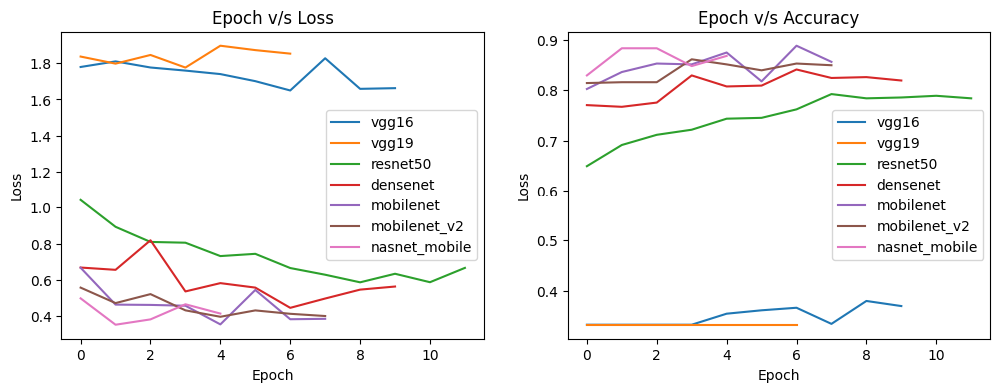

In [31]:
# plot the loss on test data for all pre-trained models
fig = plt.figure(figsize=(12,4))
axes = fig.subplots(nrows=1, ncols=2)

for mn in results_df:
    axes[0].plot(results_df[mn]['val_loss'])
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Loss')
axes[0].set_title('Epoch v/s Loss')
axes[0].legend(list(results_df.keys()))

# plot the accuracy on test data for all pre-trained models
for mn in results_df:
    axes[1].plot(results_df[mn]['val_accuracy'])
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].set_title('Epoch v/s Accuracy')
axes[1].legend(list(results_df.keys()))

In [32]:
!ls

densenet.h5  mobilenet.h5     model_1.h5  nasnet_mobile.h5  sample_data  vgg19.h5
drive	     mobilenet_v2.h5  model_2.h5  resnet50.h5	    vgg16.h5


#### Comparing the performance of pretrained models on Test data

In [33]:
# to store test acc
test_scores = {}
# iter through all saved models, load them & calculate final accuray on test data.
for m_name in all_models:
    print(f"loading {m_name}...")
    loaded_model = tf.keras.saving.load_model(m_name+'.h5')
    score, acc = loaded_model.evaluate(X_test, y_test)
    print(f"{m_name} -> Loss:{score}, Accuracy:{acc}")
    test_scores[m_name] = acc

loading vgg16...
19/19 [==============================] - 3s 122ms/step - loss: 1.6497 - accuracy: 0.3659
vgg16 -> Loss:1.6497080326080322, Accuracy:0.36593592166900635
loading vgg19...
19/19 [==============================] - 3s 143ms/step - loss: 1.7760 - accuracy: 0.3322
vgg19 -> Loss:1.7759758234024048, Accuracy:0.33220911026000977
loading resnet50...
19/19 [==============================] - 4s 115ms/step - loss: 0.5868 - accuracy: 0.7841
resnet50 -> Loss:0.586770236492157, Accuracy:0.7841483950614929
loading densenet...
19/19 [==============================] - 5s 119ms/step - loss: 0.4461 - accuracy: 0.8415
densenet -> Loss:0.44611188769340515, Accuracy:0.8414839506149292
loading mobilenet...
19/19 [==============================] - 1s 44ms/step - loss: 0.3549 - accuracy: 0.8752
mobilenet -> Loss:0.35489702224731445, Accuracy:0.8752108216285706
loading mobilenet_v2...
19/19 [==============================] - 2s 51ms/step - loss: 0.3969 - accuracy: 0.8516
mobilenet_v2 -> Loss:0.396

In [34]:
# load the best model & get the predictions on test data
best_model_name = max(test_scores, key= lambda x: test_scores[x])
print(f"Loading best model... {best_model_name}")
best_model = tf.keras.saving.load_model(f'{best_model_name}.h5')
y_proba = best_model.predict(X_test)

Loading best model... nasnet_mobile
19/19 [==============================] - 7s 75ms/step


### Reporting the final metrics on the best model

              precision    recall  f1-score   support

         Bus       0.74      0.59      0.66        49
         Car       0.93      0.93      0.93       100
       Truck       0.74      0.78      0.76        67
  motorcycle       0.88      0.70      0.78        20
 non-vehicle       0.91      0.92      0.92       197
      planes       0.92      0.96      0.94        80
      trains       0.91      0.96      0.93        80

    accuracy                           0.88       593
   macro avg       0.86      0.84      0.85       593
weighted avg       0.88      0.88      0.88       593





Text(0.5, 3.722222222222216, 'Predicted classes')

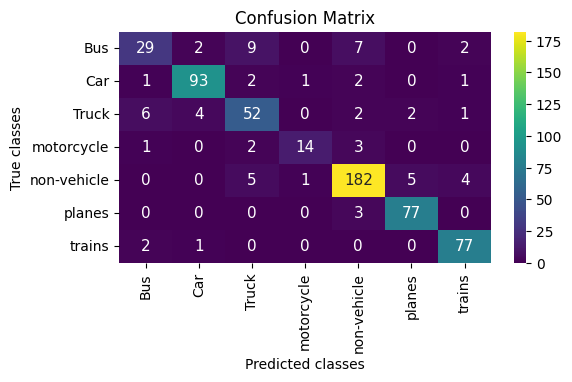

In [35]:
from sklearn import metrics
import seaborn as sns

# get the classes from predicted probabilities
y_pred_classes = y_proba.argmax(axis=-1)
# show the classification report
cr = metrics.classification_report(y_test, y_pred_classes, target_names=label_map.keys())
print(cr)
print()
print()

# get the confusion matrix
cm = metrics.confusion_matrix(y_test, y_pred_classes)
cm_df = pd.DataFrame(cm, index=label_map.keys(), columns=label_map.keys())

# initialze a plt & show the confusion matrix using seaborn heatmap
plt.figure(figsize = (6,3))
sns.heatmap(cm_df, annot=True, fmt='.0f',
            cmap = 'viridis', annot_kws={"size": 11})
plt.title('Confusion Matrix')
plt.ylabel('True classes')
plt.xlabel('Predicted classes')

In [36]:
def plot_images(img_arr, y_test, y_pred):
    """
    plots the images given an image array along
    with actual class & predicted class.
    """

    fig, axes = plt.subplots(3,3,figsize=(9,9))
    fig.subplots_adjust(bottom=0, top=0.90,)

    for i, ax in enumerate(axes.flatten()):
        img_arr[i] = img_arr[i]/255
        ax.imshow(img_arr[i])
        ax.set_title(f"y={y_test[i]}, y0={y_pred[i]}", fontsize=9)
    plt.suptitle("Actuals(y) v/s Predicted(y0)")
    plt.show()
    plt.tight_layout()

    return

Correctly Classified Images:


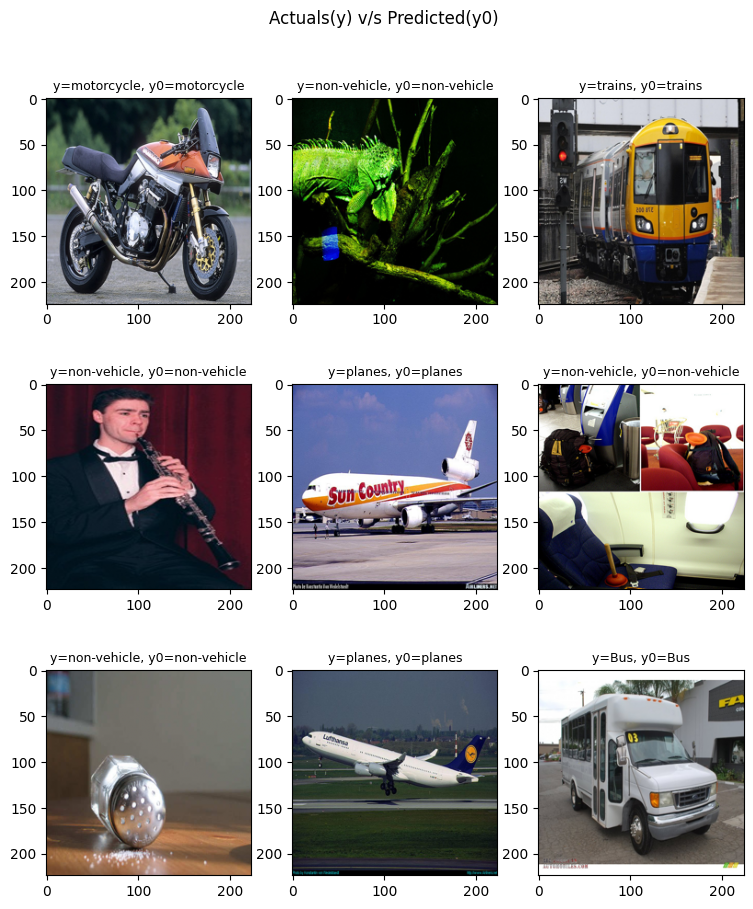

<Figure size 640x480 with 0 Axes>

In [37]:
# reverse the label map to get the classes from model predictions
rev_labels = {y:x for x,y in label_map.items()}

# filter on correctly images in test data
correct_idx = np.where(y_pred_classes == y_test)[0]
sample_idx = np.random.choice(correct_idx, 9)
pred_classes = [rev_labels[y_pred_classes[i]] for i in sample_idx]
actuals = [rev_labels[y_test[i]] for i in sample_idx]
img_arr = [X_test[i] for i in sample_idx]

# plot the correctly classified images
print("Correctly Classified Images:")
plot_images(img_arr, actuals, pred_classes)

Mis-Classified Images:


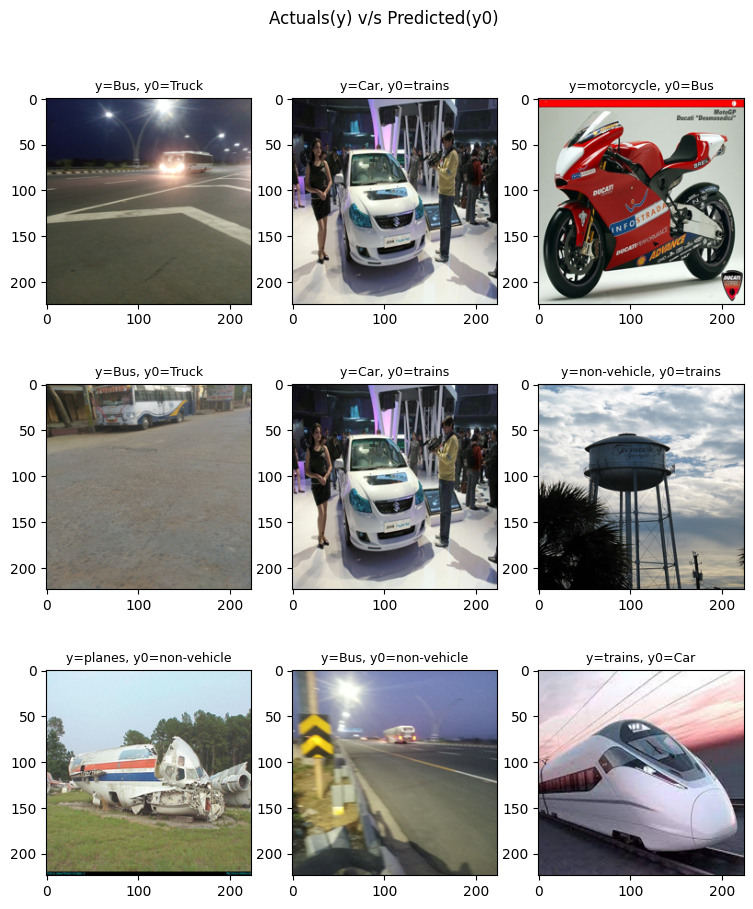

<Figure size 640x480 with 0 Axes>

In [38]:
# filter on misclassified images in test data
mis_classified = np.where(y_pred_classes != y_test)[0]
sample_idx = np.random.choice(mis_classified, 9)
pred_classes = [rev_labels[y_pred_classes[i]] for i in sample_idx]
actuals = [rev_labels[y_test[i]] for i in sample_idx]
img_arr = [X_test[i] for i in sample_idx]

# plot the misclassified images
print("Mis-Classified Images:")
plot_images(img_arr, actuals, pred_classes)

### Visualizing feature maps of the Nasnet model


*************************  Feature Maps from CONV Layer 9  *************************
1/1 [==============================] - 0s 268ms/step


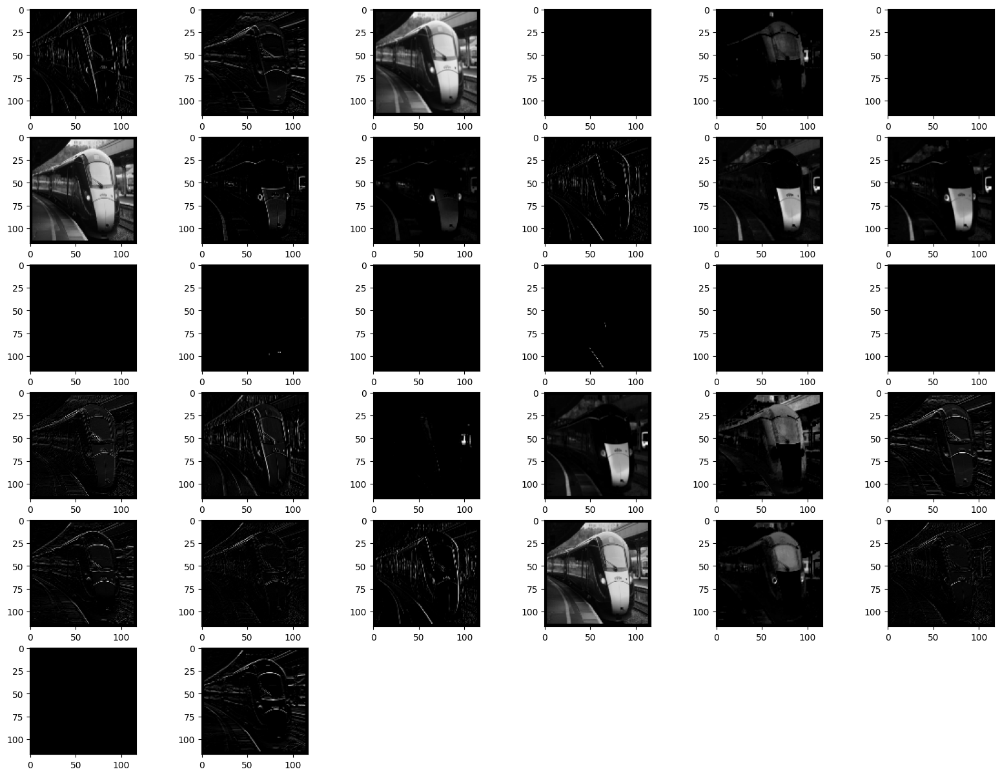


*************************  Feature Maps from CONV Layer 34  *************************
1/1 [==============================] - 0s 200ms/step


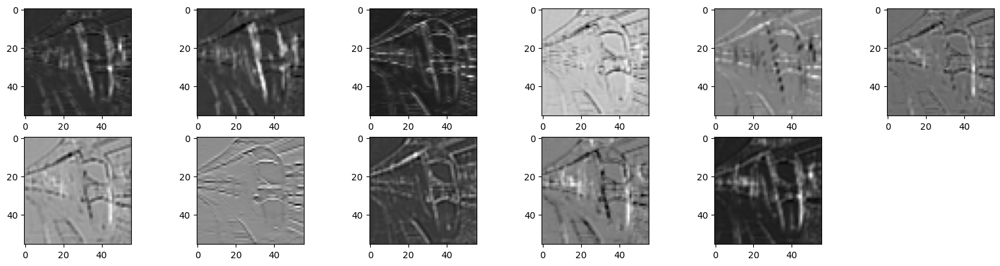


*************************  Feature Maps from CONV Layer 161  *************************
1/1 [==============================] - 1s 855ms/step


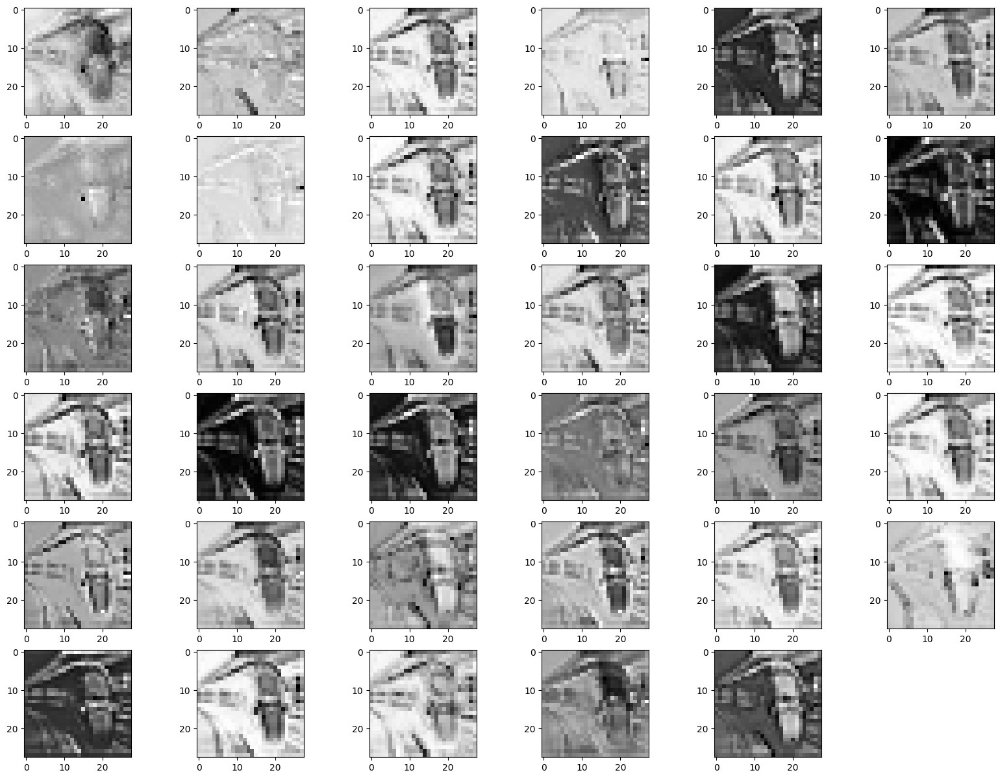

In [39]:
# iter through some random convlutional blocks
for block_num in [9, 34, 161]:
    print()
    print("*"*25, f" Feature Maps from CONV Layer {block_num} ", "*"*25)
    # create a dummy models to output feature maps
    viz_model = keras.Model(inputs=best_model.layers[2].inputs ,
                  outputs=[best_model.layers[2].layers[block_num].output])

    # calculating features_map
    features = viz_model.predict(X_test[0].reshape(-1, 224, 224, 3))

    # plot the feature maps
    fig = plt.figure(figsize=(20,15))
    for i in range(1,features.shape[3]+1):
        if i < 6*6:
            plt.subplot(6,6,i)
            plt.imshow(features[0,:,:,i-1] , cmap='gray')
    # show the plot
    plt.show()

- As seen in the feature maps of various depth, the model is learning edges of the objects present in the images and in the layers of deeper depth, the model is focusing the specific pixles and parts of the model.